# Librerie

In [1]:
from numpy.random import seed
seed(123)
from tensorflow import random
random.set_seed(123)

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
import plotly.express as px

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.deterministic import DeterministicProcess
from statsmodels.tsa.stattools import adfuller

from statsmodels.tsa.statespace.structural import UnobservedComponents
from sklearn.metrics import mean_absolute_percentage_error as mape

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import LeakyReLU
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping

# Definizione funzioni

In [2]:
def create_features(df, label=None):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X


def plot_acf_pacf(y, lags):
    """
    Plot of acf e pacf, 0-lag not included, y-axis limits adjusted automatically in the plot, alpha=0.05
    """
    fig, ax = plt.subplots(1, 2, figsize=(20,8))
    plot_acf(y, lags=lags, ax=ax[0], zero=False, auto_ylims=True, alpha=.05)
    plot_pacf(y, lags=lags, ax=ax[1], zero=False, auto_ylims=True, alpha=.05)
    plt.show()


def create_dataset(dataset, look_back=1):
    # convert an array of values into a dataset matrix
	dataX, dataY = [], []
	for i in range(len(dataset)-look_back-1):
		a = dataset[i:(i+look_back), 0]
		dataX.append(a)
		dataY.append(dataset[i + look_back, 0])
	return np.array(dataX), np.array(dataY)


def predict(num_prediction, model):
    """
    recursive prediction
    https://towardsdatascience.com/time-series-forecasting-with-recurrent-neural-networks-74674e289816
    """
    prediction_list = dataset[-look_back:]
    for _ in range(num_prediction):
        x = prediction_list[-look_back:]
        x = x.reshape((1, 1, look_back))
        out = model.predict(x)[0][0]
        prediction_list = np.append(prediction_list, out)
    prediction_list = prediction_list[look_back:]
    return prediction_list

# Importazione dataset

In [3]:
df_original = pd.read_csv("Project_data_2021_2022 (TRAINSET).csv")
df = df_original.copy(deep=True)

In [4]:
df_original

,Date,Hour,CO
0,2004-03-10,18,1360.0
1,2004-03-10,19,1292.0
2,2004-03-10,20,1402.0
3,2004-03-10,21,1376.0
4,2004-03-10,22,1272.0
...,...,...,...
8521,2005-02-28,19,938.0
8522,2005-02-28,20,939.0
8523,2005-02-28,21,827.0
8524,2005-02-28,22,776.0


# Pre processing

## Verifica duplicati

In [5]:
sum(df.duplicated())

# non sono presenti valori duplicati

0

## Sistemazione feature

In [6]:
df['date'] = pd.to_datetime(df['Date']) + pd.to_timedelta(df['Hour'], 'h')
df = df[['date', 'CO']]
df.set_index('date', inplace=True)
df.index.freq = 'H'
df

,CO
date,
2004-03-10 18:00:00,1360.0
2004-03-10 19:00:00,1292.0
2004-03-10 20:00:00,1402.0
2004-03-10 21:00:00,1376.0
2004-03-10 22:00:00,1272.0
...,...
2005-02-28 19:00:00,938.0
2005-02-28 20:00:00,939.0
2005-02-28 21:00:00,827.0


In [7]:
# si creano nuove fetaure potenzialmente utili

X, y = create_features(df, label='CO')

df = pd.concat([X, y], axis=1)
df.head()

C:\Users\loren\AppData\Local\Temp\ipykernel_12052\3142769981.py:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,CO
date,,,,,,,,,
2004-03-10 18:00:00,18,2,1,3,2004,70,10,11,1360.0
2004-03-10 19:00:00,19,2,1,3,2004,70,10,11,1292.0
2004-03-10 20:00:00,20,2,1,3,2004,70,10,11,1402.0
2004-03-10 21:00:00,21,2,1,3,2004,70,10,11,1376.0
2004-03-10 22:00:00,22,2,1,3,2004,70,10,11,1272.0


## Missing values

In [8]:
# si verifica la presenza di missing values e si adoperano le necessarie sistemazioni

df.isnull().sum()

# sono presenti 365 valori NA

hour            0
dayofweek       0
quarter         0
month           0
year            0
dayofyear       0
dayofmonth      0
weekofyear      0
CO            365
dtype: int64

In [9]:
# si analizzano i valori mancanti

df[df.isnull().any(axis=1)]

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,CO
date,,,,,,,,,
2004-04-01 14:00:00,14,3,2,4,2004,92,1,14,NaN
2004-04-01 15:00:00,15,3,2,4,2004,92,1,14,NaN
2004-04-01 16:00:00,16,3,2,4,2004,92,1,14,NaN
2004-04-08 23:00:00,23,3,2,4,2004,99,8,15,NaN
2004-04-09 00:00:00,0,4,2,4,2004,100,9,15,NaN
...,...,...,...,...,...,...,...,...,...
2005-02-11 16:00:00,16,4,1,2,2005,42,11,6,NaN
2005-02-11 17:00:00,17,4,1,2,2005,42,11,6,NaN
2005-02-11 18:00:00,18,4,1,2,2005,42,11,6,NaN


In [10]:
# linear interpolation
# df = df.interpolate(option='time')
# df.isnull().sum()

# visti i risultati non soddisfacenti della linear interpolation (soprattutto da un punto di vsta visivo) si è deciso di procedere con la media di valori precedenti e valori successivi (pensando anche alla presenza di stagionalità settimanale)

# si vuole la media dello stesso giorno alla stessa ora, considerando le due settimane precedenti e le due settimane successive
for i in range(len(df)):
  row = df.iloc[i]
  if np.isnan(row['CO']):
      prev_values = df.iloc[:i]  # sono tutti i valori che precedono la riga del dataset con il campo 'CO' null
      prev_values_same_time = prev_values[(prev_values.index.weekday==row.dayofweek) & (prev_values.index.hour==row.hour)]  # di questi valori precedenti si selezionano solamente i valori per i giorni precedenti che hanno la stessa ora e lo stesso weekday
      prev_values_same_time = prev_values_same_time.tail(2)['CO']  # di quest'ultimi si selezionano solamente gli ultimi 2, i 2 più recenti

      next_values = df.iloc[(i+1):]
      next_values_same_time = next_values[(next_values.index.weekday==row.dayofweek) & (next_values.index.hour==row.hour)]
      next_values_same_time = next_values_same_time.head(2)['CO']

      df.iloc[i, df.columns.get_loc('CO')] = np.nanmean([prev_values_same_time, next_values_same_time])  # la media gestisce i valori nan quindi nel caso si può usare anche solo il prec e il succ, in quel caso se uno di questi due non c'è prenderà solo il prec o il succ  - è possibile decidere se prendere solo l'ultimo o gli ultimi due e vicerversa per i valori successivi, in questo caso si è deciso di prenndere i 2 valori precedenti e i 2 valori successivi

# Quindi ad esempio il valore imputato alla variabile CO del giorno 1 aprile 2004 alle ore 14 è la media dei valori alle ore 14 dei 2 giorni prima: 29 marzo, 30 marzo e 3 giorni dopo: 2 aprile, 3 aprile

In [11]:
# si verifica nuovamente

df.isnull().sum()

hour          0
dayofweek     0
quarter       0
month         0
year          0
dayofyear     0
dayofmonth    0
weekofyear    0
CO            0
dtype: int64

## Divisione train test

In [12]:
df_train = df[df.index < '2005-02-01'].copy()['CO']
df_test = df[df.index >= '2005-02-01'].copy()['CO']  # si usa come test set (o validation set) l'ultimo mese

In [13]:
df_train

date
2004-03-10 18:00:00    1360.0
2004-03-10 19:00:00    1292.0
2004-03-10 20:00:00    1402.0
2004-03-10 21:00:00    1376.0
2004-03-10 22:00:00    1272.0
                        ...  
2005-01-31 19:00:00    1486.0
2005-01-31 20:00:00    1523.0
2005-01-31 21:00:00    1283.0
2005-01-31 22:00:00    1109.0
2005-01-31 23:00:00    1055.0
Freq: H, Name: CO, Length: 7854, dtype: float64

In [14]:
df_test

date
2005-02-01 00:00:00    1038.0
2005-02-01 01:00:00     996.0
2005-02-01 02:00:00     995.0
2005-02-01 03:00:00    1000.0
2005-02-01 04:00:00    1042.0
                        ...  
2005-02-28 19:00:00     938.0
2005-02-28 20:00:00     939.0
2005-02-28 21:00:00     827.0
2005-02-28 22:00:00     776.0
2005-02-28 23:00:00     755.0
Freq: H, Name: CO, Length: 672, dtype: float64

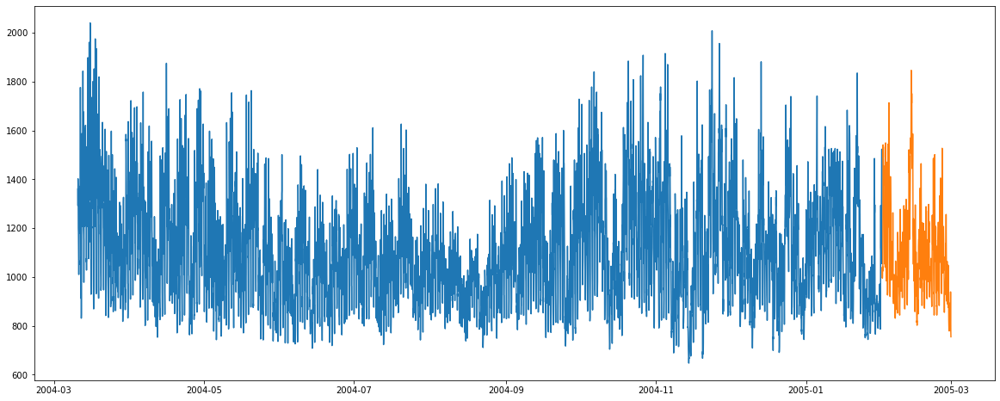

In [15]:
figure(figsize=(20, 8))

plt.plot(df_train)
plt.plot(df_test)
plt.show()

# Esplorazione

## Grafico serie storica

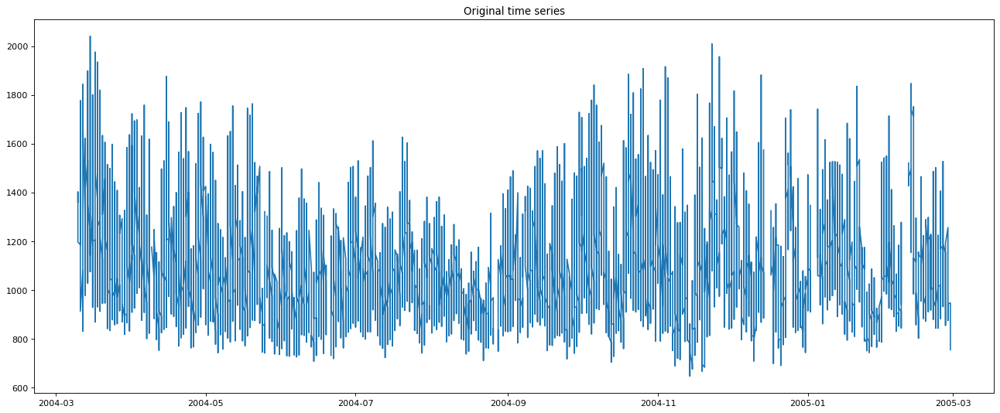

In [16]:
fig = plt.figure(figsize=(20,8), dpi=80)
plt.plot(pd.to_datetime(df_original.Date), df_original.CO)
plt.title('Original time series')
plt.show()

In [17]:
# livello orario con missing values

fig = px.line(df_original, x=df.index, y="CO", title='livello orario con missing values')
fig.show()

# livello orario senza missing values

fig = px.line(df, x=df.index, y="CO", title='livello orario senza missing values')
fig.show()

# non si osserva un trend ben preciso

# focalizzandosi a livello giornaliero si nota che all'inizio della giornata si ha una minore emissione di CO (questo evidenzia la stagionalità giornaliera) e si nota un picco intorno alle 18. In ogni casi si registra un aumento nella seconda metà del pomeriggio

In [18]:
df_day = df[['CO']].resample("D").sum()
df_day

,CO
date,
2004-03-10,7899.0
2004-03-11,29860.0
2004-03-12,30760.0
2004-03-13,31936.0
2004-03-14,32667.0
...,...
2005-02-24,27407.0
2005-02-25,27109.0
2005-02-26,24042.0


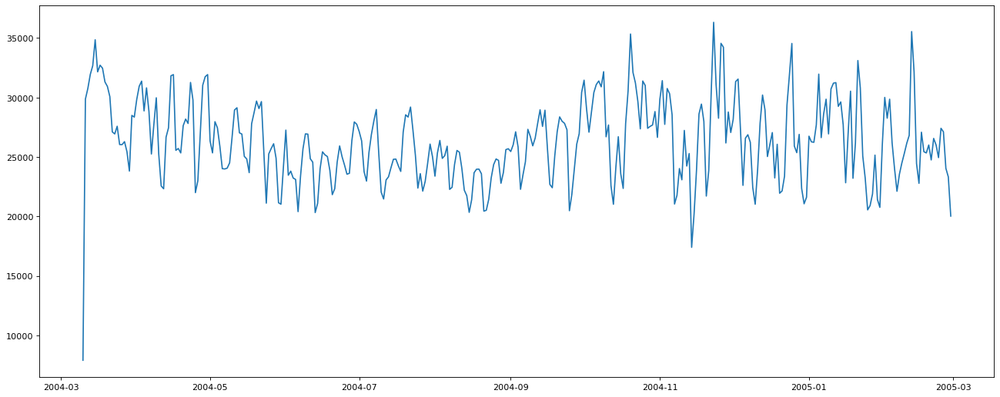

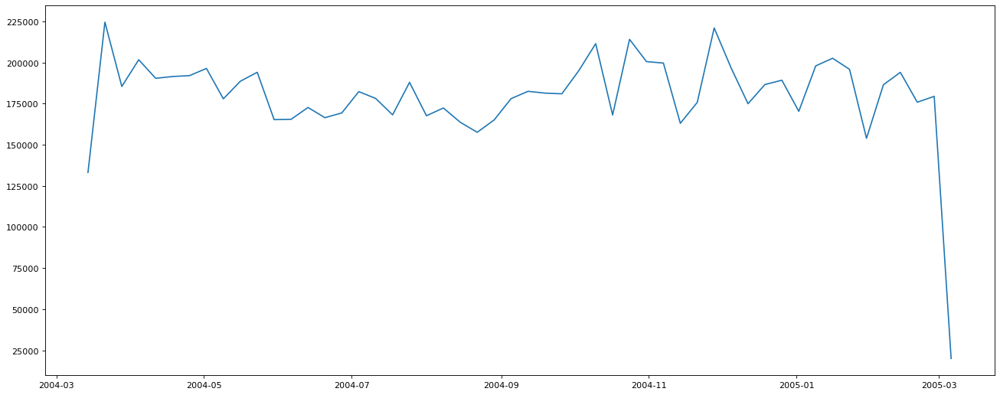

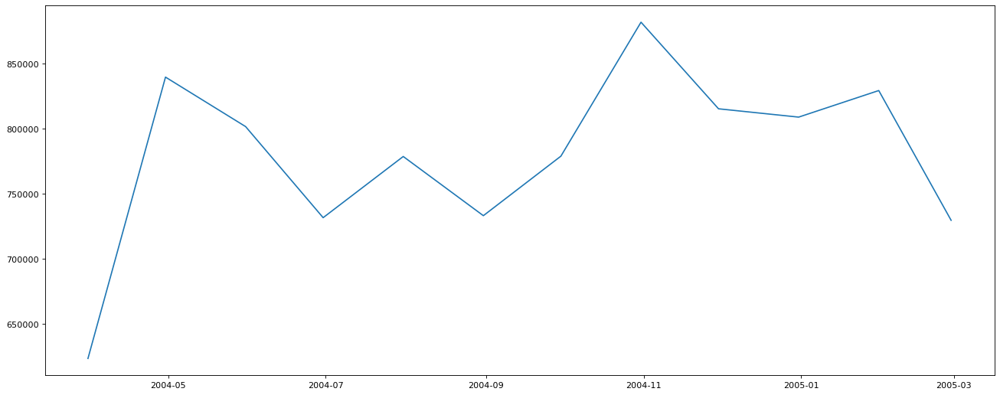

In [21]:
# si considerano granularità differenti per comprendere meglio l'andamento

# livello giornaliero
# df_day = df[['CO']].resample("D").sum()
# fig = px.line(df_day, x=df_day.index, y="CO", title='livello giornaliero')
# fig.show()

fig = plt.figure(figsize=(20,8), dpi=80)
plt.plot(df_day.index, df_day.CO)
# plt.title('Daily level')
plt.show()


# livello settimanale
df_week = df[['CO']].resample("W").sum()
# fig = px.line(df_week, x=df_week.index, y="CO", title='livello settimanale')
# fig.show()

fig = plt.figure(figsize=(20,8), dpi=80)
plt.plot(df_week.index, df_week.CO)
# plt.title('Weekly level')
plt.show()


# livello mensile
df_month = df[['CO']].resample("M").sum()
# fig = px.line(df_month, x=df_month.index, y="CO", title='livello mensile')
# fig.show()

fig = plt.figure(figsize=(20,8), dpi=80)
plt.plot(df_month.index, df_month.CO)
# plt.title('Monthly level')
plt.show()

## Analisi distribuzione

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



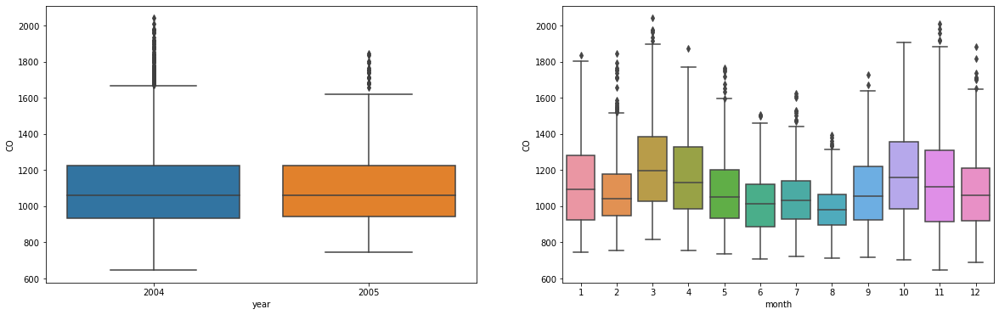

In [20]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))

sns.boxplot(df['year'], df['CO'], ax=ax[0])
ax[0].set_xlabel('year')
ax[0].set_ylabel('CO')

sns.boxplot(df['month'], df['CO'], ax=ax[1])
ax[1].set_xlabel('month')
ax[1].set_ylabel('CO')

plt.show()

# a sinistra box plot dati raggruppati annualmente, a destra a livello mensile

# la media dei valori è leggermente aumentata nel 2005

# i valori più elevati si osservano per i mesi di marzo e ottobre. Non si può tuttavia parlare di stagionalità a questo livello dal momento in cui si hanno solo un anno di dati

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



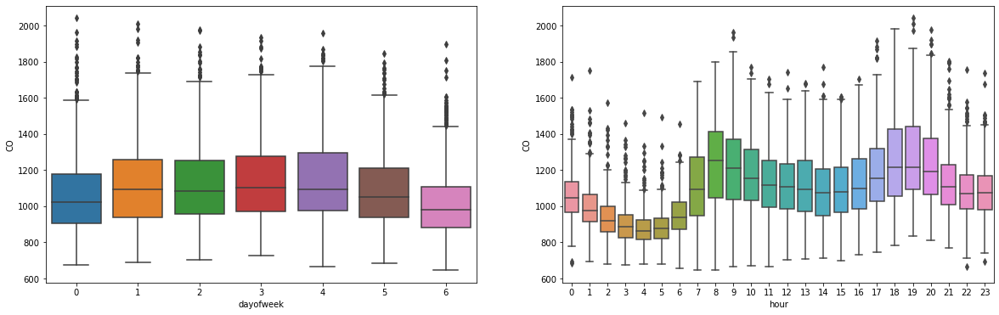

In [21]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))

sns.boxplot(df['dayofweek'], df['CO'], ax=ax[0])
ax[0].set_xlabel('dayofweek')
ax[0].set_ylabel('CO')

sns.boxplot(df['hour'], df['CO'], ax=ax[1])
ax[1].set_xlabel('hour')
ax[1].set_ylabel('CO')

plt.show()

# a sinistra box plot dati raggruppati a livello settimanale, a destra a livello giornaliero

# i giorni della settimana in cui si registrano valori più elevati di CO sono quelli centrali, con una dimunzione ad inzio e fine settimana. Questo è indice di una stagionalità settimanale. Stagionalità settimanale il che significa che si ripetono osservazioni con pattern simili ogni 168 ore

# a livello orario i valori più elevati si osservano ad inizio mattinata e inizio serata della giornata. Tra le stagionalità sicuramente quella giornaliera è quella più evidente osservando il grafico della serie storica completa. Stagionalità giornaliera il che significa che si ripetono osservazioni con pattern simili ogni 24 ore

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



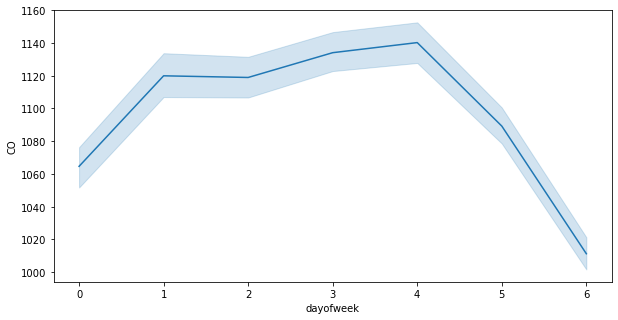

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



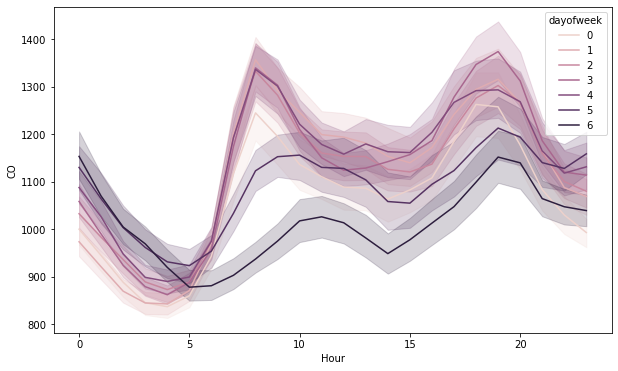

In [22]:
# da un'altra prospettiva i grafici sopra

plt.figure(figsize=(10, 5))
sns.lineplot(df['dayofweek'], df['CO'])
plt.ylabel('CO')
plt.xlabel('dayofweek')
plt.show()


plt.figure(figsize=(10, 6))
sns.lineplot(df['hour'], df['CO'], hue = df['dayofweek'])
plt.xlabel('Hour')
plt.ylabel('CO')
plt.show()

# ARIMA models

In [23]:
df_arima = df[['CO']]

In [24]:
# Pur non essendoci un trend vi è una stagionalità che rende la serie storica non stazionaria. Si stabilizza inizialmente la varianza e successivamente la media

## Non stazionarietà in varianza

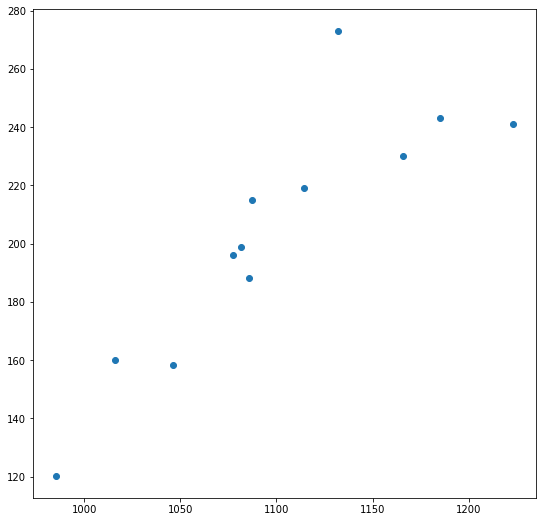

In [25]:
plt.rcParams["figure.figsize"] = (9,9)

d1 = df_arima.resample('M').mean()
x = list(d1['CO'])
d2 = df_arima.resample('M').std()
y = list(d2['CO'])

plt.scatter(x, y)
plt.show()

# Per quanto riguarda la non stazionarietà in varianza si osserva il seguente grafico. Dal momento in cui si nota una relazione lineare crescente tra il livello e la deviazione standard come trasformazione viene spesso consigliata il logaritmo

In [26]:
# Si applica perciò il logaritmo che sembra avere effetto osservando il range di valori

# pre
fig = px.line(df_arima, x = df_arima.index, y = "CO",  title = 'senza logaritmo')
fig.show()

# post
fig = px.line(np.log(df_arima), x = df_arima.index, y = "CO",  title = 'con logaritmo')
fig.show()

## Non stazionarietà in media

In [27]:
# Si procede considerando la non stazionarietà in media. Si esegue un test, Dickey-Fuller, la cui ipotesi nulla è che ci sia una radice unitaria

result = adfuller(df_arima['CO'],
                  autolag = 'AIC',  # autolag: If “AIC” (default) or “BIC”, then the number of lags is chosen to minimize the corresponding information criterion
                  regression= 'n')  # regression: “n” : no constant, no trend
print('p-value: %f' % result[1])    # p-value: 0.197302

# ipotesi nulla: serie non stazionaria
# non si rifiuta l'ipotesi nulla
# la serie non è stazionaria in media, e necessita di una differenziazione

p-value: 0.197302


In [28]:
x = np.log(df_arima)
y = x.diff(periods = 24)  # differenza stagionale (sarà il parametro D)
y

,CO
date,
2004-03-10 18:00:00,NaN
2004-03-10 19:00:00,NaN
2004-03-10 20:00:00,NaN
2004-03-10 21:00:00,NaN
2004-03-10 22:00:00,NaN
...,...
2005-02-28 19:00:00,-0.037661
2005-02-28 20:00:00,-0.109823
2005-02-28 21:00:00,-0.079019


In [29]:
# Si applica una differenziazione ogni 24 osservazioni, ovvero giornaliera, che sembra eliminare parzialmente l'effetto della stagionalità

fig = px.line(y, x = df_arima.index, y = "CO")
fig.show()

# Si nota tuttavia ancora una forte stagionalità settimanale.

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



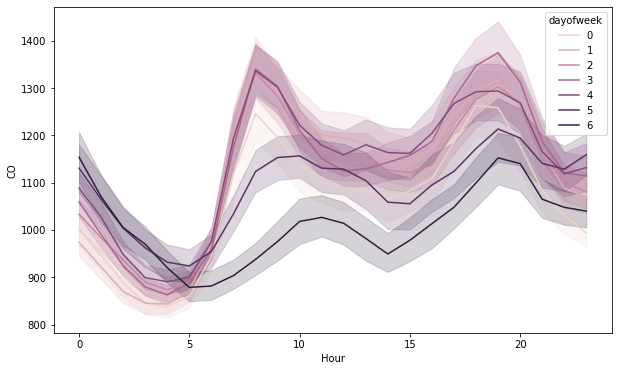

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



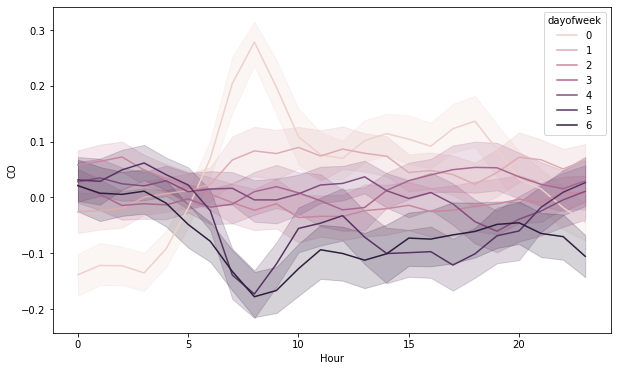

In [30]:
# Confrontando il grafico della stagionalità prima e dopo si nota la differenza, dopo aver differenziato i dati non si nota più un'evidente stagionalità (confermato anche dal grafico sopra)

# prima
plt.figure(figsize=(10, 6))
sns.lineplot(df['hour'], df['CO'], hue = df['dayofweek'])
plt.xlabel('Hour')
plt.ylabel('CO')
plt.show()

# dopo
plt.figure(figsize=(10, 6))
sns.lineplot(df['hour'], y['CO'], hue = df['dayofweek'])
plt.xlabel('Hour')
plt.ylabel('CO')
plt.show()

In [31]:
result = adfuller(y['CO'].dropna(), autolag='AIC', regression='n')
print('p-value: %f' % result[1])

# adesso infatti il p-value è minore di 0.05

p-value: 0.000000


In [32]:
# Ora sembra che la serie storica sia stazionaria. Si può dunque procedere supponendo che la serie storica sia stazionaria. Il log (parametro lambda = 0) e la diff (parte I) verranno specificati all'interno del modello ARIMA. Non è necessario dare in pasto al modello arima la serie storica già stazionaria, ci penserà poi il modello. In questo modo le previsioni non è necessario poi ritoccarle, rappresentano già i valori giusti. Si cercherà di catturare anche la stagionalità settimanale

## Model Selection, Stima, Diagnostica e Previsoni sul test set

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



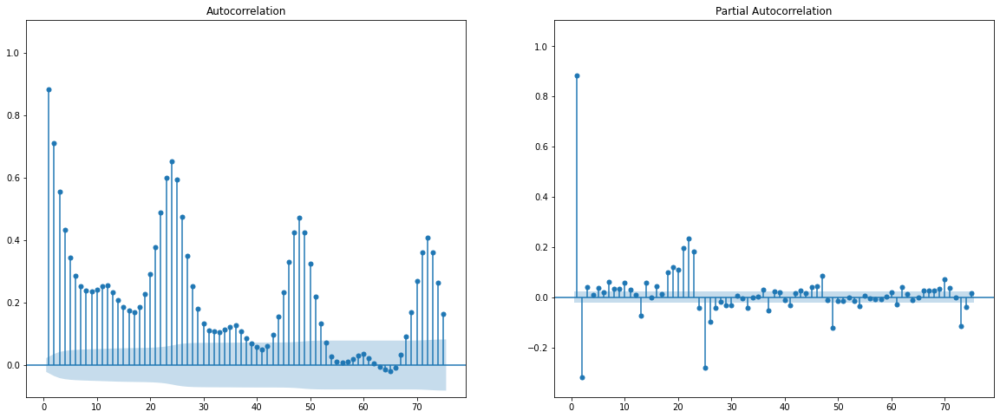

In [33]:
# Si considerano ACF e PACF del train senza aver subito trasformazioni
plot_acf_pacf(df_train, 75)

In [34]:
# conversione train test log
df_train_arima = np.log(df_train)
df_test_arima = np.log(df_test)

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



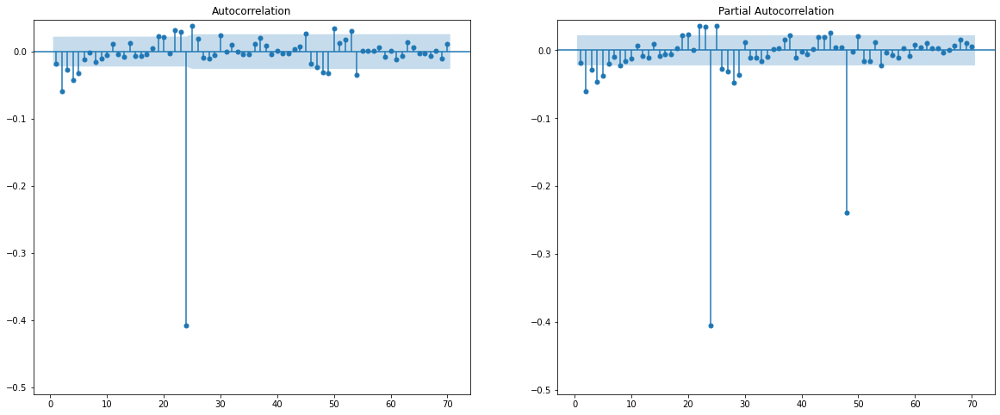

AIC:  -15544


In [35]:
# MODELLO ARIMA 1

# Si parte con un modello base che include le trasformazioni che sono state considerate precedentemente, ovvero logaritmo e differenza stagionale. Si procede dunque con lambda=0 e D=1. Si considera anche una differenza semplice

# a differenza di R in cui si può usare il parametro lambda per indicare la trasformazione logaritmica in python è bene creare prima un train su cui viene applicato il log


# fit modello
mod1 = ARIMA(df_train_arima,
             order=(0, 1, 0),
             seasonal_order=(0, 1, 0, 24))
mod1 = mod1.fit()


# acf pacf
plot_acf_pacf(mod1.resid, 70)


# previsioni
pred1 = mod1.get_prediction(start=df_test_arima.index[0], end=df_test_arima.index[-1]).predicted_mean
pred1 = np.exp(pred1)


# valutazione perfomance
aic1 = mod1.aic
mape1 = mape(df_test, pred1)
print('AIC: ', int(aic1))
# print('MAPE:', round(mape1, 4))

# figure(figsize=(20, 8), dpi=80)
# plt.plot(df_test, label='True')
# plt.plot(pred1, label='Predicted')
# plt.legend(loc="upper right")
# plt.show()

# print(mod1.summary())
# mod1.plot_diagnostics(figsize=(15, 12))
# plt.show()

del mod1


# AIC:  -15544
# MAPE: 9.0714

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



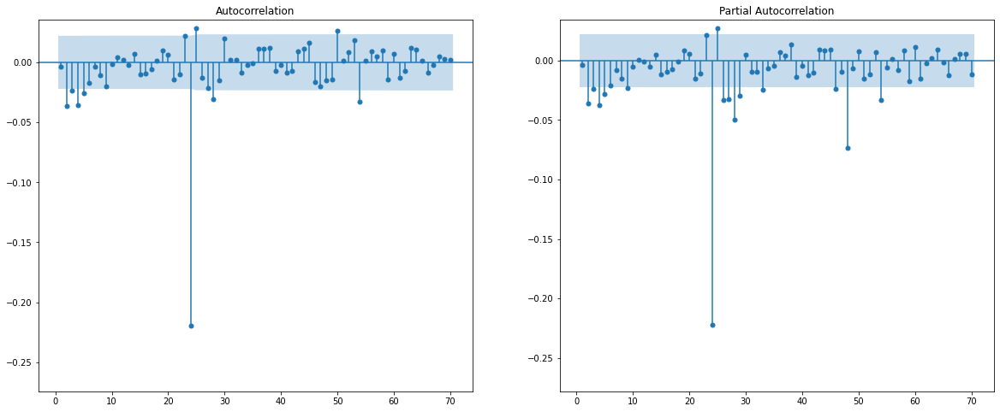

AIC:  -19685


In [36]:
# MODELLO ARIMA 2

# Si nota un'evidente stagionalità ogni 24 ore, con lag significativi sia nel ACF ma in particolare nel PACF.
# Come prevedibile dopo aver fatto una differenza stagionale osservando i grafici ACF e PACF si opta per un MA stagionale dello stesso tipo. Si procede considerando dunque un MA(1).


# fit modello
mod2 = ARIMA(df_train_arima,
             order=(0, 1, 0),
             seasonal_order=(0, 1, 1, 24))
mod2 = mod2.fit()


# acf pacf
plot_acf_pacf(mod2.resid, 70)


# previsioni
pred2 = mod2.get_prediction(start=df_test_arima.index[0], end=df_test_arima.index[-1]).predicted_mean
pred2 = np.exp(pred2)


# valutazione perfomance
aic2 = mod2.aic
mape2 = mape(df_test, pred2)
print('AIC: ', int(aic2))
# print('MAPE:', round(mape2, 4))

# figure(figsize=(20, 8), dpi=80)
# plt.plot(df_test, label='True')
# plt.plot(pred2, label='Predicted')
# plt.legend(loc="upper right")
# plt.show()

# print(mod2.summary())
# mod2.plot_diagnostics(figsize=(15, 12))
# plt.show()

del mod2


# AIC:  -19685
# MAPE: 0.1159

# la situazione sembra essere migliorata nettamente, tuttavia rimangono ancora dei lag significativi

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



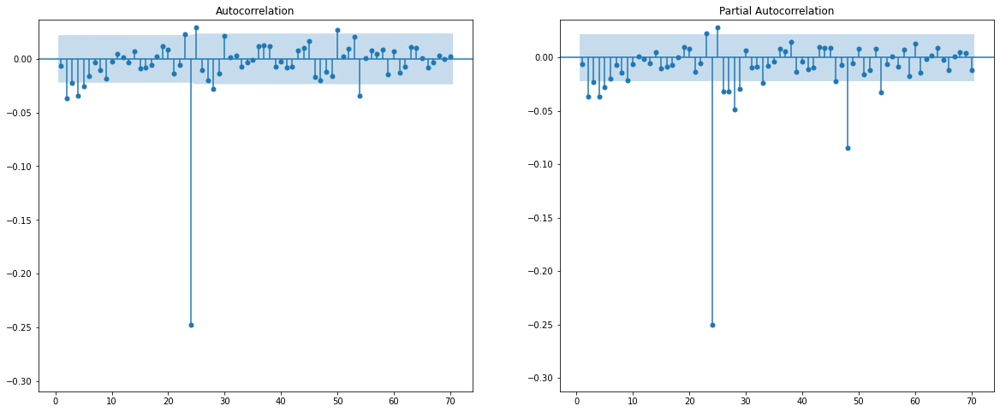

AIC:  -19742


In [37]:
# MODELLO ARIMA 3

# visti i due picchi nel pacf su multipli di 24 si prova a modellare con un AR(2) stagionale e un picco sull'acf quindi MA(1) stagionale


# fit modello
mod3 = ARIMA(df_train_arima,
             order=(0, 1, 0),
             seasonal_order=(1, 1, 1, 24))
mod3 = mod3.fit()


# acf pacf
plot_acf_pacf(mod3.resid, 70)


# previsioni
pred3 = mod3.get_prediction(start=df_test_arima.index[0], end=df_test_arima.index[-1]).predicted_mean
pred3 = np.exp(pred3)


# valutazione perfomance
aic3 = mod3.aic
mape3 = mape(df_test, pred3)
print('AIC: ', int(aic3))
# print('MAPE:', round(mape3, 4))

# figure(figsize=(20, 8), dpi=80)
# plt.plot(df_test, label='True')
# plt.plot(pred3, label='Predicted')
# plt.legend(loc="upper right")
# plt.show()

# print(mod3.summary())
# mod3.plot_diagnostics(figsize=(15, 12))
# plt.show()

del mod3


# AIC:  -19742
# MAPE: 0.1212

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



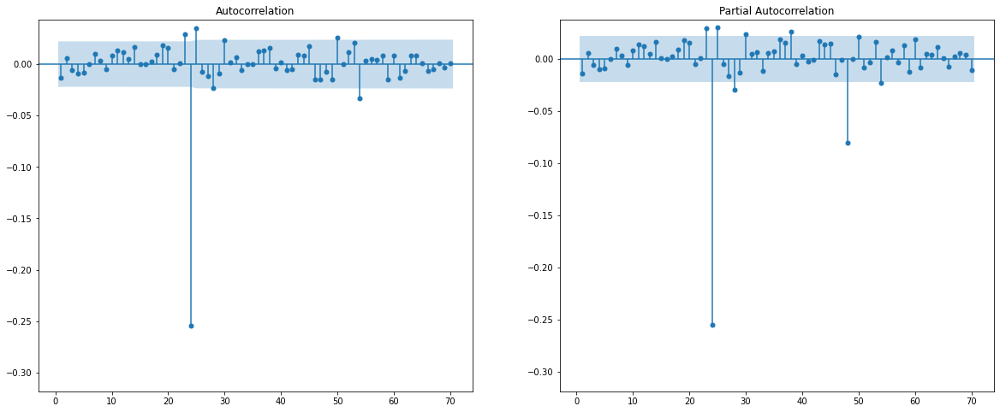

AIC:  -20260


In [38]:
# MODELLO ARIMA 4

# si prova con una grid search e poi si procederà con l'utilizzo di regressori esterni per modellare ciò che è rimasto
# analizzando i risultati della grid search e portando avanti diverse startegie si è optato per 2,2, rispettivamente per i,j

# for i in [0,1,2,3]:
#   for j in [0,1,2,3]:
#     mod = ARIMA(df_train_arima,
#                 order=(i, 1, j),
#                 seasonal_order=(1, 1, 1, 24))
#     mod = mod.fit()
#     pred = mod.get_prediction(start=df_val.index[0], end=df_val.index[-1]).predicted_mean
#     pred = np.exp(pred)
#     print([i, j, mod.aic, mape(df_val, pred)])
#     del mod


# fit modello
mod4 = ARIMA(df_train_arima,
             order=(2, 1, 2),
             seasonal_order=(1, 1, 1, 24))
mod4 = mod4.fit()


# acf pacf
plot_acf_pacf(mod4.resid, 70)


# previsioni
pred4 = mod4.get_prediction(start=df_test_arima.index[0], end=df_test_arima.index[-1]).predicted_mean
pred4 = np.exp(pred4)


# valutazione perfomance
aic4 = mod4.aic
mape4 = mape(df_test, pred4)
print('AIC: ', int(aic4))
# print('MAPE:', round(mape4, 4))

# figure(figsize=(20, 8), dpi=80)
# plt.plot(df_test, label='True')
# plt.plot(pred4, label='Predicted')
# plt.legend(loc="upper right")
# plt.show()

# print(mod4.summary())
# mod4.plot_diagnostics(figsize=(15, 12))
# plt.show()

del mod4


# AIC:  -20260
# MAPE: 0.1589

# si hanno risultati leggermente migliori, rimane però ancora molto da modellare. Si prova a procedere considerando dei regressori

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



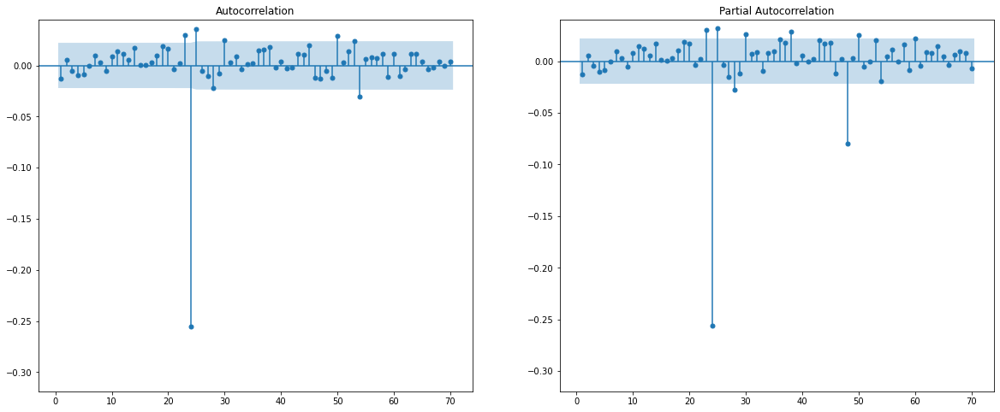

AIC:  -20297


C:\Users\loren\AppData\Local\Temp\ipykernel_2620\2422583169.py:49: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



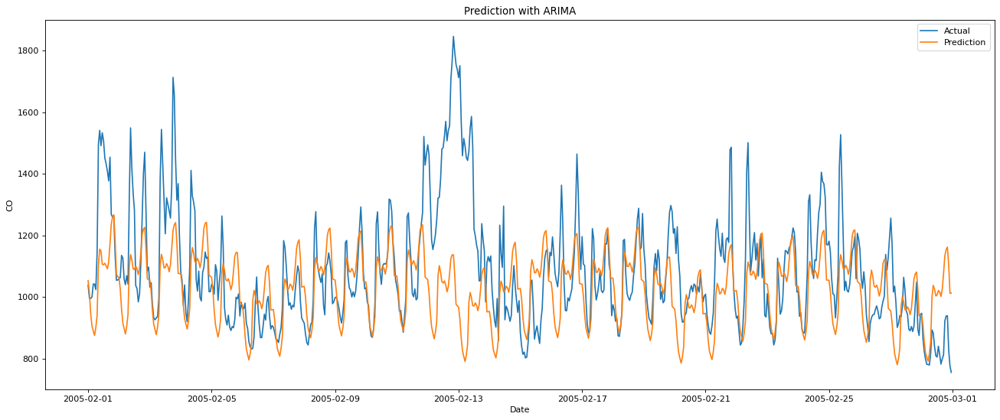

In [39]:
# MODELLO ARIMA 5 con regressori

# rimangono dei lag significativi (a livello giornaliero e in secondo luogo anche a livello settimanale) che si cerca di modellare con i regressori, in particolare tramite sinusoidi a periodo 168

# calcolo regressori
four_sett = DeterministicProcess(df_arima.index,  period=168, fourier=3)
four_sett = four_sett.in_sample()
# four_hour = DeterministicProcess(df_arima.index,  period=24, fourier=3)
# four_hour = four_hour.in_sample()

# exog = four_sett.merge(four_hour, left_index=True, right_index=True, how='inner')
exog = four_sett

exog_train = exog[exog.index < '2005-02-01']
# exog_train = exog_train.drop(columns=['date'])
exog_val = exog[exog.index >= '2005-02-01']
# exog_val = exog_val.drop(columns=['date'])


# fit modello con regressori
mod5 = ARIMA(df_train_arima, order=(2, 1, 2),
             seasonal_order=(1, 1, 1, 24),
             exog=exog_train)
mod5 = mod5.fit()


# acf pacf
plot_acf_pacf(mod5.resid, 70)


# previsioni
pred5 = mod5.get_prediction(start=df_test_arima.index[0], end=df_test_arima.index[-1], exog=exog_val).predicted_mean
pred5 = np.exp(pred5)


# valutazione perfomance
aic5 = mod5.aic
mape5 = mape(df_test, pred5)
print('AIC: ', int(aic5))
# print('MAPE:', round(mape5, 4))

# figure(figsize=(20, 8), dpi=80)
# plt.plot(df_test, label='True')
# plt.plot(pred5, label='Predicted')
# plt.legend(loc="upper right")
# plt.show()

fig=plt.figure(figsize=(20,8), dpi=80)
fig.show()
ax=fig.add_subplot()
plt.title('Prediction with ARIMA')
plt.xlabel('Date')
plt.ylabel('CO')
ax.plot(df_test, label='Actual')
ax.plot(pred5, label='Prediction')
plt.legend()
plt.show()

# print(mod5.summary())
# mod5.plot_diagnostics(figsize=(15, 12))
# plt.show()

del mod5


# AIC:  -20297
# MAPE: 0.1062

# in termini di AIC c'è comunque un miglioramento

## Previsione mese di marzo

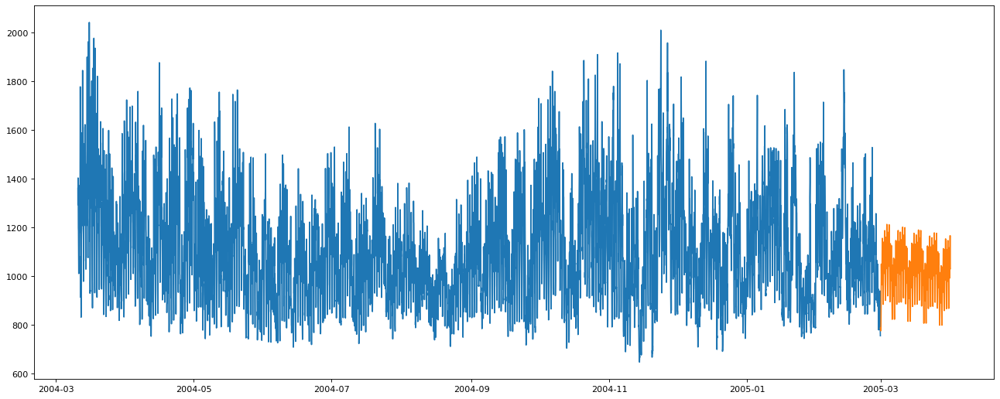

In [40]:
# calcolo regressori
dates_march = pd.date_range(start='2005-03-01 00:00:00', end='2005-03-31 23:00:00', freq='h')
df_march = pd.DataFrame()
df_march.index = dates_march
df_march['CO'] = None
df_tot = pd.concat([df_arima, df_march], axis=0)
df_tot = df_tot[['CO']]

four_sett_tot = DeterministicProcess(df_tot.index,  period=168, fourier=3)
four_sett_tot = four_sett_tot.in_sample()
# four_hour_tot = DeterministicProcess(df_arima.index,  period=24, fourier=3)
# four_hour_tot = four_hour_tot.in_sample()
# four_hour_tot

# exog = four_sett_tot.merge(four_hour_tot, left_index=True, right_index=True, how='inner')
exog_tot = four_sett_tot

exog_train_tot = exog_tot[exog_tot.index < '2005-03-01']
# exog_train = exog_train.drop(columns=['date'])

exog_march = exog_tot[exog_tot.index >= '2005-03-01']
# exog_val = exog_val.drop(columns=['date'])


# fit modello
mod6 = ARIMA(np.log(df_arima[['CO']]),
            order=(2, 1, 2),
            seasonal_order=(1, 1, 1, 24),
            exog=exog_train_tot)
mod6 = mod6.fit()


# previsioni
pred = mod6.get_prediction(start=df_march.index[0], end=df_march.index[-1], exog=exog_march).predicted_mean
pred = np.exp(pred)


# valutazione perfomance
# print(mod6.summary())


# grafico previsioni
figure(figsize=(20, 8), dpi=80)
plt.plot(df_arima['CO'])
plt.plot(pred)
plt.show()

# fig=plt.figure(figsize=(20,8), dpi=80)
# fig.show()
# ax=fig.add_subplot(111)
# plt.title('Prediction with ARIMA')
# ax.plot(df_arima['CO'], label='Actual')
# ax.plot(pred, label='Prediction')
# plt.legend()
# plt.show()

In [41]:
# salvataggio dei risultati

# creazione dataframe per salvataggio risultati
column_names = ["Date", "Hour", "ARIMA", "UCM", "ML"]
results_df = pd.DataFrame(columns = column_names)
results_df['Date'] = dates_march
results_df['Hour'] = results_df['Date'].dt.hour
results_df['Date'] = pd.to_datetime(results_df['Date']).dt.date

# salvataggio risultati ARIMA
results_df['ARIMA'] = pred.values
results_df

,Date,Hour,ARIMA,UCM,ML
0,2005-03-01,0,786.836418,NaN,NaN
1,2005-03-01,1,786.419719,NaN,NaN
2,2005-03-01,2,775.299463,NaN,NaN
3,2005-03-01,3,775.432200,NaN,NaN
4,2005-03-01,4,777.597073,NaN,NaN
...,...,...,...,...,...
739,2005-03-31,19,1145.277922,NaN,NaN
740,2005-03-31,20,1165.556843,NaN,NaN
741,2005-03-31,21,1091.067030,NaN,NaN
742,2005-03-31,22,1036.962151,NaN,NaN


# UCM models

## Selezione modello

In [42]:
# parametro LEVEL

# Il parametro level modella la componente di trend
# LEVEL and SLOPE specify the trend component. LEVEL can stand alone by itself, but SLOPE may not be used unless LEVEL is present. If only LEVEL is specified, the resulting trend is a walk. If LEVEL and SLOPE are both specified, the resulting trend is a locally linear trend
# The level/trend components can be specified using the boolean keyword arguments level, stochastic_level, trend, etc., or all at once as a string argument to level.

levels = ['ntrend',  # No trend
          'dconstant',  # Deterministic constant
          'llevel',  # Local level
          'rwalk',  # Random walk
          'dtrend',  # Deterministic trend
          'lldtrend',  #Local linear deterministic trend
          'rwdrift',  # Random walk with drift
          'lltrend',  # Local linear trend
          'strend',  # Smooth trend
          'rtrend',  # Random trend
          ]

for l in levels:
  mod = UnobservedComponents(df_train,
                              seasonal = 24,
                              level = l,
                              random_state = 123
                              )
  mod = mod.fit()
  pred = mod.get_prediction(start=df_test.index[0], end=df_test.index[-1]).predicted_mean
  print([l, mod.aic, 100*mape(df_test, pred)])
  del mod

# risultato migliore: random walk con drift


# ['ntrend', 132204.86216885858, 100.72691289468861]
# ['dconstant', 104027.65626736367, 12.163535078009103]
# ['llevel', 91661.9901293847, 12.202270837413035]
# ['rwalk', 91659.99042527453, 12.202037540562223]
# ['dtrend', 104028.76766299334, 11.954115378967309]
# ['lldtrend', 91654.40768852043, 12.03838636809101]
# ['rwdrift', 91652.40403722246, 12.038193376275338]
# ['lltrend', 91656.40388484386, 12.038386914433831]
# ['strend', 94506.95114281011, 2412.270989107889]
# ['rtrend', 96516.58871627574, 1487.70666378284]

['ntrend', 132204.86216885858, 100.72691289468861]
['dconstant', 104027.65626736367, 12.163535078009103]
['llevel', 91661.9901293847, 12.202270837413035]
['rwalk', 91659.99042527453, 12.202037540562223]
['dtrend', 104028.76766299334, 11.954115378967309]
['lldtrend', 91654.40768852043, 12.03838636809101]
['rwdrift', 91652.40403722246, 12.038193376275338]
['lltrend', 91656.40388484386, 12.038386914433831]
['strend', 94506.95114281011, 2412.270989107889]
['rtrend', 96516.58871627574, 1487.70666378284]


In [43]:
# parametro SEASONAL

# A seasonal pattern exists when there exists a consistent pattern of variation influenced by seasonal factors (e.g., the quarter of the year, or day of the week, etc.).

harmonics_daily = [2,3,4,5,6,7]
harmonics_weekly = [2,3,4,5,6]

for i in harmonics_daily:
  for j in harmonics_weekly:
    mod = UnobservedComponents(df_train,
                                seasonal = 24,
                                level = 'rwdrift',  # quello che si è ottenuto come risultato migliore nel passo precedente
                                freq_seasonal = [{'period': 24, 'harmonics': i},
                                                 {'period': 168, 'harmonics': j}],
                                random_state = 123)
    mod = mod.fit()
    pred = mod.get_prediction(start=df_test.index[0], end=df_test.index[-1]).predicted_mean
    print([i, j, mod.aic, 100*mape(df_test, pred)])
    del mod

# risultato milgiore: sinusoids_daily=2 & sinusoids_weekly=3, infatti a parità di mape si ha un aic migliore


# [2, 2, 91422.30074170732, 11.037624871508722]
# [2, 3, 91414.60186150967, 11.024284486942049]
# [2, 4, 91405.88551629252, 11.0572624719983]
# [2, 5, 91385.86326611199, 11.503720238347562]
# [2, 6, 91337.53054439681, 11.873435687641146]
# [3, 2, 91337.35865384404, 11.155487833653211]
# [3, 3, 91328.94093846015, 11.131122177757053]
# [3, 4, 91317.19555091595, 11.179936273254075]
# [3, 5, 91295.49744641472, 11.702624804836297]
# [3, 6, 91251.10725163246, 12.161241477933148]
# [4, 2, 91255.5122487688, 11.16083541545222]
# [4, 3, 91243.52823672035, 11.142869023222746]
# [4, 4, 91231.49967061632, 11.173932014000986]
# [4, 5, 91212.8908920443, 11.623869786012937]
# [4, 6, 91169.0156096587, 12.025072479800587]
# [5, 2, 91217.0295141172, 11.287172694634114]
# [5, 3, 91206.92488023949, 11.261134834387555]
# [5, 4, 91196.88585549245, 11.311670055388515]
# [5, 5, 91179.70202276728, 11.832427041925675]
# [5, 6, 91133.30676458713, 12.299171443216826]
# [6, 2, 91152.97203003829, 11.331660085687638]
# [6, 3, 91142.82602989156, 11.304809472716332]
# [6, 4, 91134.92479193327, 11.357193409195407]
# [6, 5, 91115.50569029762, 11.888579278776715]
# [6, 6, 91069.81239613694, 12.357016575387789]
# [7, 2, 91161.08225734258, 11.42302372814599]
# [7, 3, 91152.6417427629, 11.394302789646968]
# [7, 4, 91143.13360294097, 11.450092691090065]
# [7, 5, 91124.09972634734, 11.998173676113003]
# [7, 6, 91070.12411443207, 12.466264787566136]

[2, 2, 91422.30074170732, 11.037624871508722]
[2, 3, 91414.60186150967, 11.024284486942049]
[2, 4, 91405.88551629252, 11.0572624719983]
[2, 5, 91385.86326611199, 11.503720238347562]
[2, 6, 91337.53054439681, 11.873435687641146]
[3, 2, 91337.35865384404, 11.155487833653211]
[3, 3, 91328.94093846015, 11.131122177757053]
[3, 4, 91317.19555091595, 11.179936273254075]
[3, 5, 91295.49744641472, 11.702624804836297]
[3, 6, 91251.10725163246, 12.161241477933148]
[4, 2, 91255.5122487688, 11.16083541545222]
[4, 3, 91243.52823672035, 11.142869023222746]
[4, 4, 91231.49967061632, 11.173932014000986]
[4, 5, 91212.8908920443, 11.623869786012937]
[4, 6, 91169.0156096587, 12.025072479800587]
[5, 2, 91217.0295141172, 11.287172694634114]
[5, 3, 91206.92488023949, 11.261134834387555]
[5, 4, 91196.88585549245, 11.311670055388515]
[5, 5, 91179.70202276728, 11.832427041925675]
[5, 6, 91133.30676458713, 12.299171443216826]
[6, 2, 91152.97203003829, 11.331660085687638]
[6, 3, 91142.82602989156, 11.304809472716

In [44]:
# parametro CYCLE

# Il ciclo rappresenta fluttuazioni di medio periodo, non periodiche che si presentano ogni certo numero di anni. In questo caso considerando i dati a disposizione non è rilevante considerare il parametro ciclo
# Cycles in a time series data exists when the data exhibit rises and falls that are not of fixed period. The duration of these fluctuations is usually of at least 2 years.
# The cyclical component is intended to capture cyclical effects at time frames much longer than captured by the seasonal component.

In [45]:
# Il modello migliore risulta essere dunque:

mod = UnobservedComponents(df_train,
                                seasonal = 24,
                                level = 'rwdrift',  # quello che si è ottenuto come risultato migliore nel passo precedente
                                freq_seasonal = [{'period': 24, 'harmonics': 2},
                                                 {'period': 168, 'harmonics': 3}],
                                random_state = 123)
mod = mod.fit()
pred = mod.get_prediction(start=df_test.index[0], end=df_test.index[-1]).predicted_mean

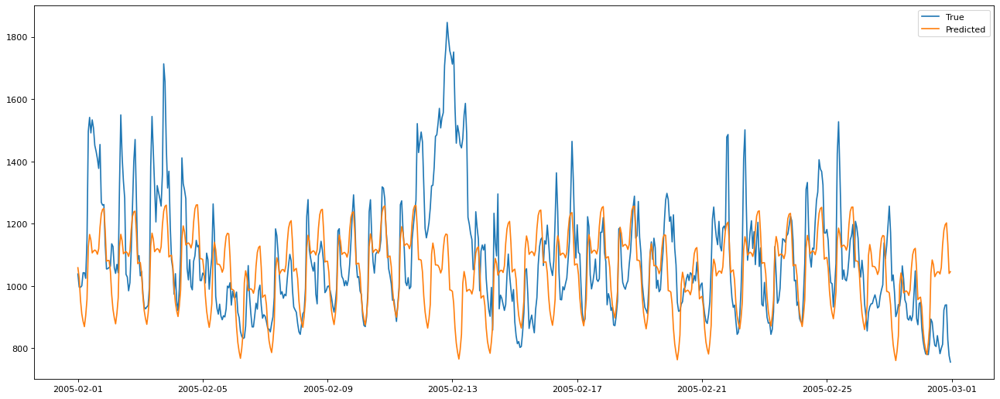

In [46]:
figure(figsize=(20, 8), dpi=80)
plt.plot(df_test, label='True')
plt.plot(pred, label='Predicted')
plt.legend(loc="upper right")
plt.show()

## Previsioni mese di marzo

In [47]:
# previsione finale sul mese di marzo

# modello ucm con parametri migliori
mod = UnobservedComponents(df_train,
                            level = 'rwdrift',
                            seasonal = 24,
                            freq_seasonal = [{'period': 24, 'harmonics': 3},
                                             {'period': 168, 'harmonics': 2}],
                            random_state = 123)
mod = mod.fit()


# previsioni
march_prediction = mod.get_prediction(start=pd.to_datetime('2005-03-01-0',  format = "%Y-%m-%d-%H"), end=pd.to_datetime('2005-03-31-23',  format = "%Y-%m-%d-%H")).predicted_mean

C:\Users\loren\AppData\Local\Temp\ipykernel_2620\3385136668.py:9: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



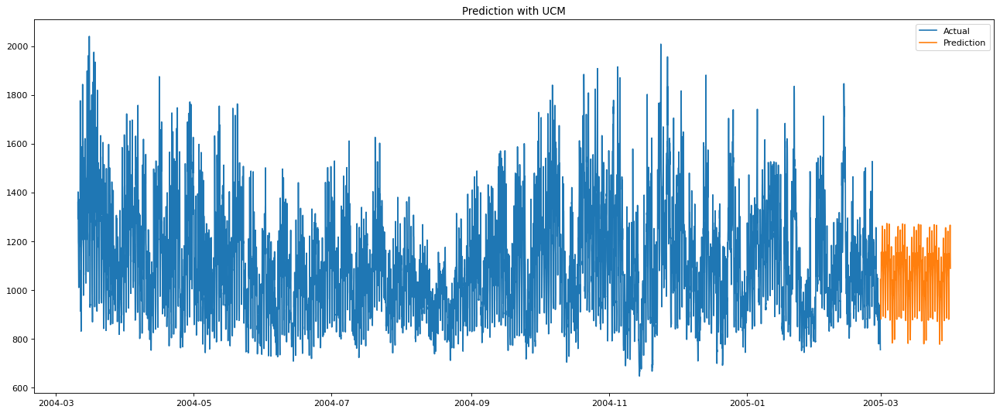

In [48]:
# plotto le previsioni

# figure(figsize=(20, 8))
# plt.plot(df['CO'])
# plt.plot(march_prediction)
# plt.show()

fig=plt.figure(figsize=(20,8), dpi=80)
fig.show()
ax=fig.add_subplot()
plt.title('Prediction with UCM')
ax.plot(df['CO'], label='Actual')
ax.plot(march_prediction, label='Prediction')
plt.legend()
plt.show()

In [49]:
# salvataggio risultati UCM
results_df['UCM'] = march_prediction.values
results_df

,Date,Hour,ARIMA,UCM,ML
0,2005-03-01,0,786.836418,1042.901091,NaN
1,2005-03-01,1,786.419719,1009.673837,NaN
2,2005-03-01,2,775.299463,947.727562,NaN
3,2005-03-01,3,775.432200,911.824199,NaN
4,2005-03-01,4,777.597073,896.210336,NaN
...,...,...,...,...,...
739,2005-03-31,19,1145.277922,1257.475474,NaN
740,2005-03-31,20,1165.556843,1266.035831,NaN
741,2005-03-31,21,1091.067030,1199.570705,NaN
742,2005-03-31,22,1036.962151,1094.652424,NaN


# Machine learning models

## KNN

In [50]:
# creazione datatset

df_knn = df.reset_index()
df_knn = df_knn[['date', 'CO']]
df_knn.rename(columns={'date':'Date_Hour'}, inplace=True)

df_knn.to_csv("dataset_knn.csv", index=False)

In [51]:
%load_ext rpy2.ipython
%reload_ext rpy2.ipython

Unable to determine R home: [WinError 2] Impossibile trovare il file specificato
Unable to determine R library path: Command '('D:\\R-4.1.2\\bin\\Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 1.
D:\Anaconda\envs\env_timeseries_ucm_ml\lib\site-packages\rpy2\robjects\packages.py:366: UserWarning:

The symbol 'quartz' is not in this R namespace/package.



### Setting

In [52]:
%%R

# Package names
packages <- c("readr",  "zoo", "forcats", "tidyr", "forecast", "lubridate",
              "dplyr", "caret", "xts", "tsfknn", "Metrics")

# Install packages not yet installed
installed_packages <- packages %in% rownames(installed.packages())
if (any(installed_packages == FALSE)) {
  install.packages(packages[!installed_packages])
}

# Packages loading
invisible(lapply(packages, library, character.only = TRUE))

set.seed(123)


dataset <- read_csv("dataset_knn.csv", col_types = cols(Date = col_character()))

# specifying the format
format <- "%Y-%m-%d %H"
dataset$Date_Hour <- as.POSIXct(dataset$Date_Hour, format=format)


# create time series object
xts_co <- xts(x = dataset$CO, order.by = dataset$Date_Hour)
train <- xts_co[1:7854]
test <- xts_co[7855:8526]

xts_co_num <- as.numeric(xts_co)
train_num <- as.numeric(train)
test_num <-as.numeric(test)

R[write to console]: 
Attaching package: 'zoo'


R[write to console]: The following objects are masked from 'package:base':

    as.Date, as.Date.numeric


R[write to console]: Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

R[write to console]: 
Attaching package: 'lubridate'


R[write to console]: The following objects are masked from 'package:base':

    date, intersect, setdiff, union


R[write to console]: 
Attaching package: 'dplyr'


R[write to console]: The following objects are masked from 'package:stats':

    filter, lag


R[write to console]: The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union


R[write to console]: Loading required package: ggplot2

R[write to console]: Loading required package: lattice

R[write to console]: 
Attaching package: 'xts'


R[write to console]: The following objects are masked from 'package:dplyr':

    first, last


R[write to console]: 
Attaching pac

### Selezione modello

In [53]:
%%R

k_values <- seq(2, 40, 2)  # numero di sottosequenze simili da prendere in considerazione (number of nearest neighbors used by the KNN model)
lags_values <- c(24*7, 24*14, 24*21)  # numero di valori passati che vengono considerati
score <- c()
for (lag_value in lags_values){
  for (k_value in k_values){
    mod <- knn_forecasting(train_num, h = 672, lags = 1:lag_value, k = k_value, msas = "MIMO")
    pred <- mod$pred
    mape_value <- mean(abs(pred - test_num)/test_num)
    score <- append(k_value, lag_value)
    print(c(score, mape_value))
  }
}


# [1]   2.0000000 168.0000000   0.1456265
# [1]   4.0000000 168.0000000   0.1440283
# [1]   6.0000000 168.0000000   0.1306797
# [1]   8.0000000 168.0000000   0.1327723
# [1]  10.0000000 168.0000000   0.1198516
# [1]  12.0000000 168.0000000   0.1206045
# [1]  14.0000000 168.0000000   0.1184529
# [1]  16.0000000 168.0000000   0.1154475
# [1]  18.0000000 168.0000000   0.1166457
# [1]  20.0000000 168.0000000   0.1164191
# [1]  22.0000000 168.0000000   0.1157884
# [1]  24.0000000 168.0000000   0.1161162
# [1]  26.0000000 168.0000000   0.1155085
# [1]  28.0000000 168.0000000   0.1144292
# [1]  30.0000000 168.0000000   0.1138847
# [1]  32.0000000 168.0000000   0.1129113
# [1]  34.0000000 168.0000000   0.1152779
# [1]  36.0000000 168.0000000   0.1125322
# [1]  38.0000000 168.0000000   0.1131705
# [1]  40.0000000 168.0000000   0.1135884
# [1]   2.0000000 336.0000000   0.1475217
# [1]   4.000000 336.000000   0.140727
# [1]   6.0000000 336.0000000   0.1379064
# [1]   8.0000000 336.0000000   0.1329749
# [1]  10.0000000 336.0000000   0.1180921
# [1]  12.0000000 336.0000000   0.1149561
# [1]  14.0000000 336.0000000   0.1118563
# [1]  16.0000000 336.0000000   0.1103245
# [1]  18.0000000 336.0000000   0.1106194
# [1]  20.0000000 336.0000000   0.1092384
# [1]  22.0000000 336.0000000   0.1069047
# [1]  24.0000000 336.0000000   0.1068108
# [1]  26.000000 336.000000   0.106485
# [1]  28.0000000 336.0000000   0.1080452
# [1]  30.0000000 336.0000000   0.1077108
# [1]  32.0000000 336.0000000   0.1090831
# [1]  34.0000000 336.0000000   0.1091303
# [1]  36.0000000 336.0000000   0.1090051
# [1]  38.0000000 336.0000000   0.1091402
# [1]  40.000000 336.000000   0.109626
# [1]   2.0000000 504.0000000   0.1390808
# [1]   4.0000000 504.0000000   0.1119718
# [1]   6.0000000 504.0000000   0.1143409
# [1]   8.0000000 504.0000000   0.1088485
# [1]  10.0000000 504.0000000   0.1066501
# [1]  12.0000000 504.0000000   0.1050379
# [1]  14.0000000 504.0000000   0.1046702
# [1]  16.0000000 504.0000000   0.1047369
# [1]  18.0000000 504.0000000   0.1044585
# [1]  20.0000000 504.0000000   0.1050611
# [1]  22.0000000 504.0000000   0.1055209
# [1]  24.0000000 504.0000000   0.1070588
# [1]  26.0000000 504.0000000   0.1072871
# [1]  28.000000 504.000000   0.106992
# [1]  30.0000000 504.0000000   0.1075956
# [1]  32.0000000 504.0000000   0.1059142
# [1]  34.0000000 504.0000000   0.1063855
# [1]  36.0000000 504.0000000   0.1062886
# [1]  38.0000000 504.0000000   0.1069311
# [1]  40.0000000 504.0000000   0.1083435

[1]   2.0000000 168.0000000   0.1456265
[1]   4.0000000 168.0000000   0.1440283
[1]   6.0000000 168.0000000   0.1306797
[1]   8.0000000 168.0000000   0.1327723
[1]  10.0000000 168.0000000   0.1198516
[1]  12.0000000 168.0000000   0.1206045
[1]  14.0000000 168.0000000   0.1184529
[1]  16.0000000 168.0000000   0.1154475
[1]  18.0000000 168.0000000   0.1166457
[1]  20.0000000 168.0000000   0.1164191
[1]  22.0000000 168.0000000   0.1157884
[1]  24.0000000 168.0000000   0.1161162
[1]  26.0000000 168.0000000   0.1155085
[1]  28.0000000 168.0000000   0.1144292
[1]  30.0000000 168.0000000   0.1138847
[1]  32.0000000 168.0000000   0.1129113
[1]  34.0000000 168.0000000   0.1152779
[1]  36.0000000 168.0000000   0.1125322
[1]  38.0000000 168.0000000   0.1131705
[1]  40.0000000 168.0000000   0.1135884
[1]   2.0000000 336.0000000   0.1475217
[1]   4.000000 336.000000   0.140727
[1]   6.0000000 336.0000000   0.1379064
[1]   8.0000000 336.0000000   0.1329749
[1]  10.0000000 336.0000000   0.1180921
[1]

In [54]:
%%R

# stima del modello migliore
# best values: lags=1:504, k=18
best_K <- 18
best_lag <- 504
# significa che si va a cercare 18 sequenze simili nelle 504 osservazioni precenti a quella dalla quale bisogna prevedere. Il futuro di queste 85 sotto sequenze sarà simile al futuro ignoto della sequenza in questione. Più precisamente si avrà la sequenza X_t-p:t dove p è 504, è la sequenza per cui bisogna calcolare il futuro, bisogna andare a cercare nel dataset delle sequenze simili alla sequenza appena riportata, ma di cui in questo caso non si conosce il futuro
# si è nel caso multi step multi output (e non ricorsivo), come visto a lezione

mod <- knn_forecasting(train_num, h = 672, lags = 1:best_lag,  k = best_K, msas = "MIMO")
pred <- mod$pred
score_mod <- mean(abs(pred-test_num)/test_num)  # mape
score_mod  # 0.1044585

[1] 0.1044585


### Visualizzazione risultati

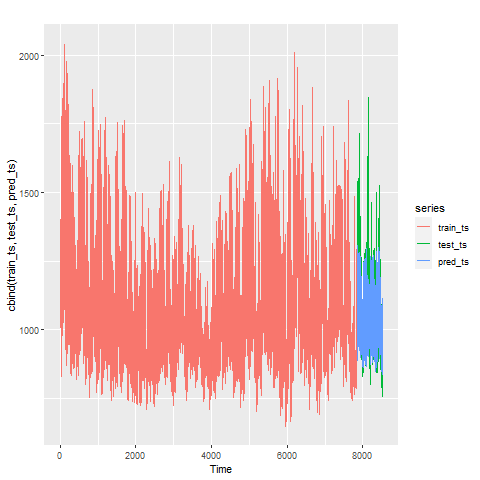

In [55]:
%%R

train_ts <- ts(train_num, start = 1, end = 7854)
test_ts <- ts(test_num, start = 7855, end = 8526)
pred_ts <- ts(pred, start = 7855, end = 8526)

autoplot(cbind(train_ts, test_ts, pred_ts))

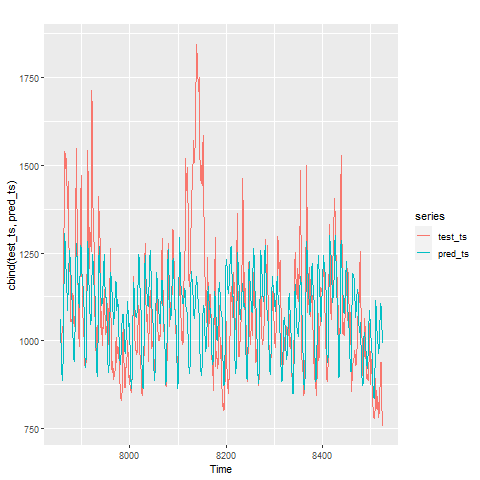

In [56]:
%%R

test_ts <- ts(test_num, start = 7855, end = 8526)
pred_ts <- ts(pred, start = 7855, end = 8526)

autoplot(cbind(test_ts, pred_ts))

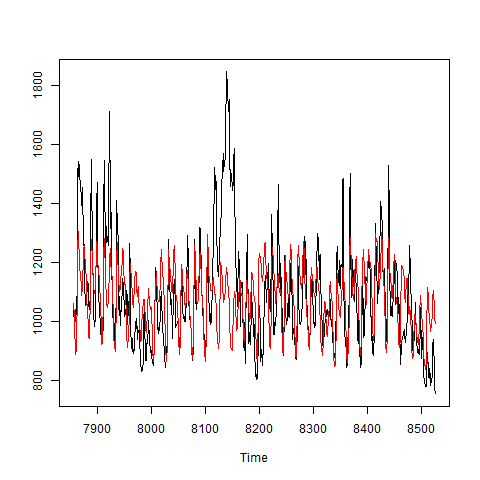

In [57]:
%%R

ts.plot(test_ts, pred_ts, gpars = list(col = c("black", "red")))

### Previsioni mese di marzo

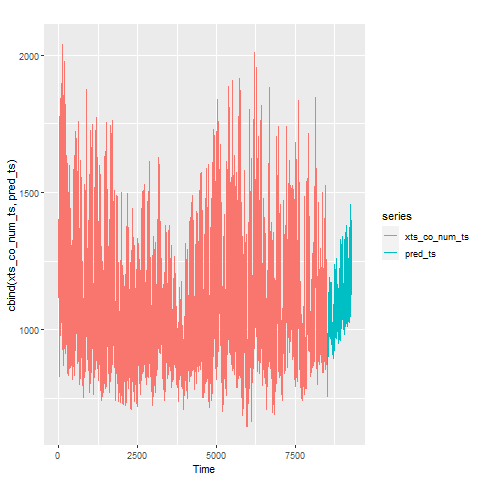

In [58]:
%%R

best_lag = 504
best_K = 18
# previsioni sul modello di marzo
# utilizzando i parametri migliori ottenuti precedentemente si applica l'algoritmo knn in questo caso sull'intero dataset e non solamente sul train

mod <- knn_forecasting(xts_co_num, h = 743, lags = 1:best_lag,  k = best_K, msas = "MIMO")  # considerando l'intero mese di marzo si hanno 743 istanti temporali
pred <- mod$pred

xts_co_num_ts <- ts(xts_co_num, start = 1, end= 8526)
pred_ts <- ts(pred, start = 8527, end = 9269)

autoplot(cbind(xts_co_num_ts, pred_ts))

In [59]:
%%R

length(pred_ts)

[1] 743


In [60]:
%%R

# salvataggio risultati
dates_march <- seq(as.POSIXct("2005-03-01 00:00:00"), as.POSIXct("2005-03-31 23:00:00"), by = "hour")  # 743 elementi
results_df <- data.frame(date = dates_march, CO = as.matrix(pred_ts))
results_df

                   date        CO
1   2005-03-01 00:00:00  987.3682
2   2005-03-01 01:00:00  945.2016
3   2005-03-01 02:00:00  908.1460
4   2005-03-01 03:00:00  889.9793
5   2005-03-01 04:00:00  874.7016
6   2005-03-01 05:00:00  877.6460
7   2005-03-01 06:00:00  897.9238
8   2005-03-01 07:00:00  947.5349
9   2005-03-01 08:00:00  999.8682
10  2005-03-01 09:00:00 1040.5904
11  2005-03-01 10:00:00 1044.0904
12  2005-03-01 11:00:00 1034.3127
13  2005-03-01 12:00:00 1000.2571
14  2005-03-01 13:00:00  955.4238
15  2005-03-01 14:00:00  924.8127
16  2005-03-01 15:00:00  901.7016
17  2005-03-01 16:00:00  908.4793
18  2005-03-01 17:00:00  926.7016
19  2005-03-01 18:00:00  962.2571
20  2005-03-01 19:00:00 1008.8682
21  2005-03-01 20:00:00 1060.4238
22  2005-03-01 21:00:00 1070.3682
23  2005-03-01 22:00:00 1073.9238
24  2005-03-01 23:00:00 1051.2571
25  2005-03-02 00:00:00 1019.0349
26  2005-03-02 01:00:00  988.7016
27  2005-03-02 02:00:00  955.5349
28  2005-03-02 03:00:00  925.8127
29  2005-03-02

In [61]:
%%R

write.csv(results_df, "results_knn.csv")

## Long Short-Term Memory (LSTM)

### Preparazione dati

In [62]:
# il dataset viene convertito in un array di valori di tipo float, essendo una struttura più ottimale per la rete neurale
dataframe = df[['CO']]
dataframe = dataframe.values
dataframe = dataframe.astype('float32')
dataframe

array([[1360.],
       [1292.],
       [1402.],
       ...,
       [ 827.],
       [ 776.],
       [ 755.]], dtype=float32)

In [63]:
# è buona pratica scalare (normalizzare) i dati nel range 0:1 dal momento in cui i modelli LSTMs sono sensibili all scala dei dati in input. Per fare tale operazione si utilizza MinMaxScaler di scikit-learn
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataframe)

# creazione train e test set con febbraio 2005 come test set
train, test = dataset[0:7854,:], dataset[7855:len(dataset),:]
print(len(train), len(test))

7854 671


In [64]:
look_back = 168  # indica il numero di osservazioni precedenti che verranno utilizzate per predirre il valore del giorno successivo. Dunque con lookback pari a 168 siginfica che si prenderennao in considerazione le 168 osservazioni precedenti per fare la previsione


# rimodellazione dei dati con finestra di lookback pari a 168: la funzione prende in input il dataset che in questo risulta essere un array e lookback che è il numero di osservazioni del passato da considerare
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

In [65]:
trainX   # nelle colonne ci sono i 168 istanti precendeti, ad esempio considerando una riga qualunque la colonna 1 è l'osservazione all'istante prec, colonna 2 sarà due istanti precedenti e cosi via

array([[0.511845  , 0.4630294 , 0.54199576, ..., 0.40201005, 0.51543427,
        0.43072507],
       [0.4630294 , 0.54199576, 0.5233309 , ..., 0.51543427, 0.43072507,
        0.6532663 ],
       [0.54199576, 0.5233309 , 0.4486719 , ..., 0.43072507, 0.6532663 ,
        0.9519024 ],
       ...,
       [0.23618093, 0.16152188, 0.11342427, ..., 0.45656857, 0.5506102 ,
        0.6022972 ],
       [0.16152188, 0.11342427, 0.10983488, ..., 0.5506102 , 0.6022972 ,
        0.62885857],
       [0.11342427, 0.10983488, 0.09906676, ..., 0.6022972 , 0.62885857,
        0.45656857]], dtype=float32)

In [66]:
trainX.shape

(7685, 168)

In [67]:
trainY  # sono i valori da prevedere sulla base delle 168 osservazioni precedenti

array([0.6532663 , 0.9519024 , 0.95333815, ..., 0.62885857, 0.45656857,
       0.33165827], dtype=float32)

In [68]:
trainY.shape

(7685,)

In [69]:
# LSTMs richiedono i dati in input in un certo formato: [samples, time steps, features]. In questo momento si ha la forma [samples, features]. Si procede al ridimensionamento delle finestre di input (train e test input) tramite la funzione reshape(), creando dei tensori:
# - samples: numero di finestre a disposizione
# - time steps: dimensione della finestra di input
# - feature = 1 se la serie è univariata, feature = k se la serie è multivariata con k features


trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

### Creazione architettura rete

In [70]:
# creazione e fit della rete LSTM

# permette di stoppare il training quando la metrica che viene monitorata smette di registrare miglioramenti. Viene fatto ciò perchè un numero troppo elevato di epoche potrebbe portare ad overfitting.
early_stop = EarlyStopping(monitor = 'loss',  # quantity to be monitored
                           patience = 2)  # number of epochs with no improvement after which training will be stopped

model = Sequential()  # la rete viene costruita in maniera sequenziale
model.add(LSTM(10, input_shape=(1, look_back), return_sequences=True))
model.add(LeakyReLU())  # LeakyRelu as an activation function
model.add(Dropout(0.2))
model.add(LSTM(5, return_sequences=False))
model.add(LeakyReLU())  # LeakyRelu as an activation function
# model.add(Dropout(0.5))
model.add(Dense(1))  # si predice un passo in avanti, quindi data una porzione di serie temporale di 168 elementi (look_back) si predice un singolo step avanti

model.compile(loss='mean_squared_error',  # funzione di errore che dovrà essere minimizzata in fase di training
              optimizer='adam')  # ottimizzatore utilizzato

model.fit(trainX, trainY, epochs=100, batch_size=32, verbose=2, callbacks = [early_stop], shuffle=False)
# batch size: ogni quanti dati aggiorno i pesi della mia rete neurale 128

Epoch 1/100
241/241 - 5s - loss: 0.0371
Epoch 2/100
241/241 - 0s - loss: 0.0176
Epoch 3/100
241/241 - 0s - loss: 0.0121
Epoch 4/100
241/241 - 0s - loss: 0.0104
Epoch 5/100
241/241 - 0s - loss: 0.0097
Epoch 6/100
241/241 - 0s - loss: 0.0089
Epoch 7/100
241/241 - 0s - loss: 0.0084
Epoch 8/100
241/241 - 0s - loss: 0.0083
Epoch 9/100
241/241 - 0s - loss: 0.0076
Epoch 10/100
241/241 - 0s - loss: 0.0073
Epoch 11/100
241/241 - 0s - loss: 0.0070
Epoch 12/100
241/241 - 0s - loss: 0.0067
Epoch 13/100
241/241 - 0s - loss: 0.0066
Epoch 14/100
241/241 - 0s - loss: 0.0062
Epoch 15/100
241/241 - 0s - loss: 0.0061
Epoch 16/100
241/241 - 0s - loss: 0.0058
Epoch 17/100
241/241 - 0s - loss: 0.0057
Epoch 18/100
241/241 - 0s - loss: 0.0054
Epoch 19/100
241/241 - 0s - loss: 0.0055
Epoch 20/100
241/241 - 0s - loss: 0.0054


In [71]:
# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# valutazione perfomance
testScore = mape(testY[0], testPredict[:,0])
print('Test Score: %.4f MAPE' % (testScore))  # Test Score: 0.0479 MAPE

Test Score: 0.0645 MAPE


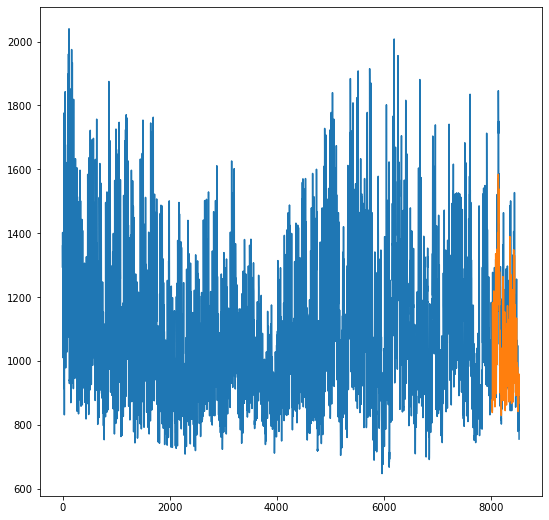

In [72]:
# Previsioni grafico addestramento modello
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-2, :] = testPredict

plt.plot(scaler.inverse_transform(dataset))
plt.plot(testPredictPlot)
plt.show()

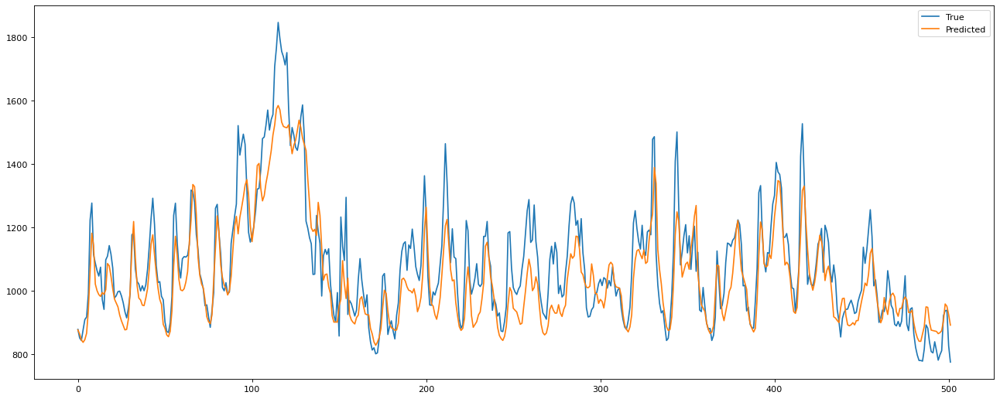

In [73]:
# Previsioni grafico addestramento modello

figure(figsize=(20, 8), dpi=80)
plt.plot(testY[0], label='True')
plt.plot(testPredict[:,0], label='Predicted')
plt.legend(loc="upper right")
plt.show()

# dovrebbe essere più piccolo perche non si hanno le prime e ultime osservazioni? infatti se si aggiunge 168 si arriva a 672

### Previsioni mese di marzo

In [74]:
# Previsione mese di marzo
dates_march = pd.date_range(start='2005-03-01 00:00:00', end='2005-03-31 23:00:00', freq='h')
dates_march

DatetimeIndex(['2005-03-01 00:00:00', '2005-03-01 01:00:00',
               '2005-03-01 02:00:00', '2005-03-01 03:00:00',
               '2005-03-01 04:00:00', '2005-03-01 05:00:00',
               '2005-03-01 06:00:00', '2005-03-01 07:00:00',
               '2005-03-01 08:00:00', '2005-03-01 09:00:00',
               ...
               '2005-03-31 14:00:00', '2005-03-31 15:00:00',
               '2005-03-31 16:00:00', '2005-03-31 17:00:00',
               '2005-03-31 18:00:00', '2005-03-31 19:00:00',
               '2005-03-31 20:00:00', '2005-03-31 21:00:00',
               '2005-03-31 22:00:00', '2005-03-31 23:00:00'],
              dtype='datetime64[ns]', length=744, freq='H')

In [75]:
train = dataset  # è già stato scalato, in questo caso si addestra il modello sull'intero dataset

# si procede in modo analogo a prima
trainX, trainY = create_dataset(train, look_back)
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))

In [76]:
# creazione e fit della rete LSTM

early_stop = EarlyStopping(monitor = 'loss',
                           patience = 2)

model = Sequential()
model.add(LSTM(10, input_shape=(1, look_back), return_sequences=True))
model.add(LeakyReLU())
model.add(Dropout(0.2))
model.add(LSTM(5, return_sequences=False))
model.add(LeakyReLU())
# model.add(Dropout(0.5))
model.add(Dense(1))

model.compile(loss='mean_squared_error',
              optimizer='adam')

model.fit(trainX, trainY, epochs=100, batch_size=32, verbose=2, callbacks = [early_stop], shuffle=False)

Epoch 1/100
262/262 - 4s - loss: 0.0279
Epoch 2/100
262/262 - 0s - loss: 0.0158
Epoch 3/100
262/262 - 0s - loss: 0.0119
Epoch 4/100
262/262 - 1s - loss: 0.0104
Epoch 5/100
262/262 - 0s - loss: 0.0095
Epoch 6/100
262/262 - 0s - loss: 0.0088
Epoch 7/100
262/262 - 0s - loss: 0.0084
Epoch 8/100
262/262 - 0s - loss: 0.0081
Epoch 9/100
262/262 - 0s - loss: 0.0076
Epoch 10/100
262/262 - 0s - loss: 0.0072
Epoch 11/100
262/262 - 0s - loss: 0.0070
Epoch 12/100
262/262 - 0s - loss: 0.0067
Epoch 13/100
262/262 - 0s - loss: 0.0065
Epoch 14/100
262/262 - 0s - loss: 0.0064
Epoch 15/100
262/262 - 0s - loss: 0.0062
Epoch 16/100
262/262 - 0s - loss: 0.0061
Epoch 17/100
262/262 - 0s - loss: 0.0059
Epoch 18/100
262/262 - 0s - loss: 0.0057
Epoch 19/100
262/262 - 0s - loss: 0.0055
Epoch 20/100
262/262 - 0s - loss: 0.0054
Epoch 21/100
262/262 - 0s - loss: 0.0053
Epoch 22/100
262/262 - 0s - loss: 0.0053
Epoch 23/100
262/262 - 0s - loss: 0.0050
Epoch 24/100
262/262 - 0s - loss: 0.0049
Epoch 25/100
262/262 - 0s

In [77]:
# si esegue la previsione in maniera ricorsiva per il mese di marzo 2005

forecast = predict(744, model)

forecast = scaler.inverse_transform(forecast.reshape(-1,1)).flatten()  # per riottenere i dati con la scala originale

C:\Users\loren\AppData\Local\Temp\ipykernel_2620\1869959680.py:13: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



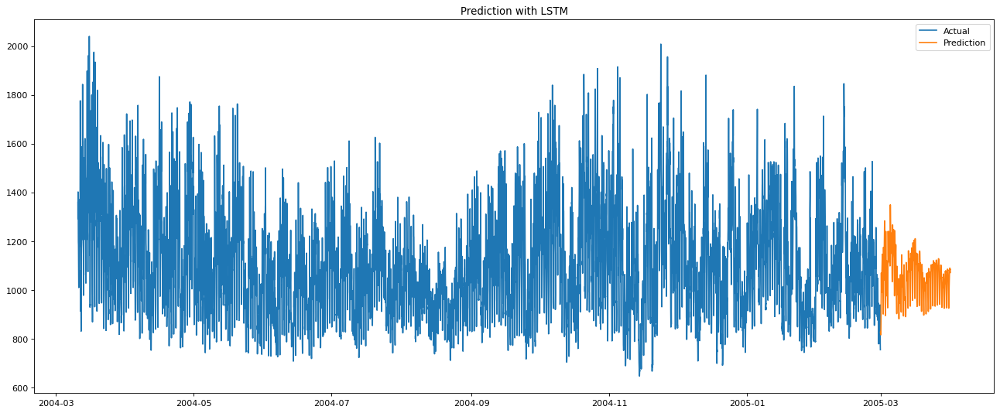

In [78]:
# viusalizzazione grafica previsioni mese di marzo

# dati a disposizione
df = df.reset_index()
ts = df[['date','CO']].set_index('date')

# previsioni
forecast_df = pd.DataFrame()
forecast_df.index = dates_march
forecast_df['CO'] = forecast

fig=plt.figure(figsize=(20,8), dpi=80)
fig.show()
ax=fig.add_subplot()
plt.title('Prediction with LSTM')
ax.plot(ts, label='Actual')
ax.plot(forecast_df['CO'], label='Prediction')
plt.legend()
plt.show()

In [79]:
# si salva il modello che ha ottenuto i risultati migliori tra knn e lstm (famiglia machine learning)

# se si opta per knn
# file = pd.read_csv('results_knn.csv')
# file = file[['date', 'CO']]
# results_df['ML'] = file['CO']
# results_df

# se si opta per lstm
results_df['ML'] = forecast_df['CO'].values

# Risultati finali

In [80]:
results_df

,Date,Hour,ARIMA,UCM,ML
0,2005-03-01,0,786.836418,1042.901091,827.056396
1,2005-03-01,1,786.419719,1009.673837,825.076416
2,2005-03-01,2,775.299463,947.727562,818.265686
3,2005-03-01,3,775.432200,911.824199,819.572144
4,2005-03-01,4,777.597073,896.210336,815.957886
...,...,...,...,...,...
739,2005-03-31,19,1145.277922,1257.475474,1085.581421
740,2005-03-31,20,1165.556843,1266.035831,1084.302002
741,2005-03-31,21,1091.067030,1199.570705,1085.786987
742,2005-03-31,22,1036.962151,1094.652424,1082.864258


In [81]:
# viene effettuato un round dei risultati in modo tale da rispettare il formato richiesto

results_df[['ARIMA']] = results_df[['ARIMA']].round()
results_df[['UCM']] = results_df[['UCM']].round()
results_df[['ML']] = results_df[['ML']].round()
results_df

,Date,Hour,ARIMA,UCM,ML
0,2005-03-01,0,787.0,1043.0,827.0
1,2005-03-01,1,786.0,1010.0,825.0
2,2005-03-01,2,775.0,948.0,818.0
3,2005-03-01,3,775.0,912.0,820.0
4,2005-03-01,4,778.0,896.0,816.0
...,...,...,...,...,...
739,2005-03-31,19,1145.0,1257.0,1086.0
740,2005-03-31,20,1166.0,1266.0,1084.0
741,2005-03-31,21,1091.0,1200.0,1086.0
742,2005-03-31,22,1037.0,1095.0,1083.0


In [82]:
results_df.to_csv("829776_20220612.csv", index=False)